In [1]:
import pathlib
import os

ROOT = pathlib.Path('/notebooks/data')

In [49]:
from IPython.display import display, HTML
import random
from PIL import Image
import matplotlib.pyplot as plt
import math

def is_valid_file(file):
    file = str(file)
    return file.endswith('png') or file.endswith('jpg') or file.endswith('jpeg') or file.endswith('gif')

class Dataset:
    def __init__(self, folder, n=20):
        self.folder = folder
        self.n = n
        self.files = self.get_images_from_folder(self.folder)

    def get_images_from_folder(self, folder):
        # print('folder', folder)

        files = []        
        for file in os.listdir(folder):
            if os.path.isdir(folder / file):
                # print('folder', file)
                for subfile in self.get_images_from_folder(folder / file):
                    if is_valid_file(folder / file / subfile):
                        files.append(folder / file / subfile)
            else:
                if is_valid_file(folder / file):
                    files.append(folder / file)
        random.shuffle(files)
        return files
    
def show_folder(folder, figsize, cols=9, rows=5):
    COLS = cols
    dataset = Dataset(folder, n=COLS * rows)
    files = dataset.files
    if len(files) == 0:
        raise Exception('no files found')
    MAX_ROWS = math.ceil(len(files) / COLS)
    f, axarr = plt.subplots(min(rows, MAX_ROWS), COLS, figsize=figsize)
    # plt.show()
    
    for row in range(rows):
        for col in range(COLS):
            index = (row * COLS) + col
            if len(files) > index:
                image = files[index]
                # print(image)
                a = plt.imread(image)
                axarr[row, col].imshow(a)
            else:
                print('no images for index', index, len(files))                          

# Available Datasets

In [45]:
[f for f in os.listdir(ROOT) if not f.startswith('.')]

['div2k',
 'OutdoorSceneTraining',
 'wikiart',
 'data',
 'Flickr2K',
 'ffhq',
 'deepsat-sat4']

# Div2K

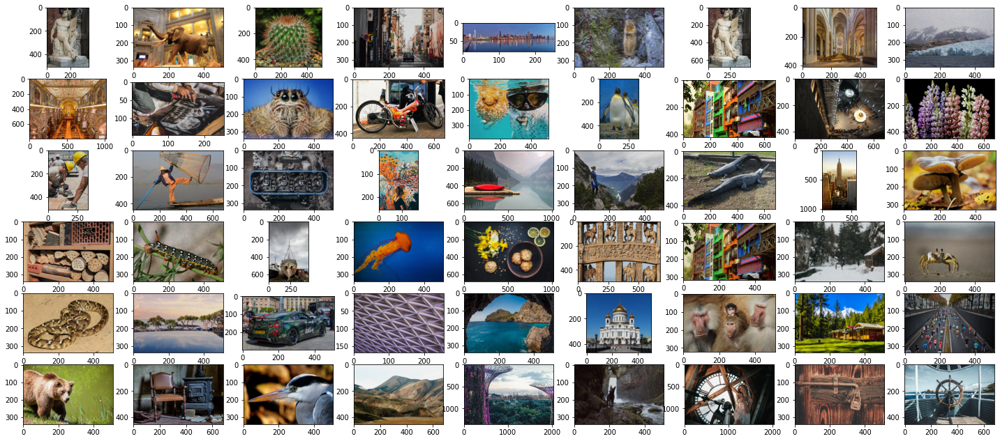

In [53]:
show_folder(ROOT / 'div2k', cols=9, rows=6, figsize=(25, 11))            

# Outdoor Scene Training

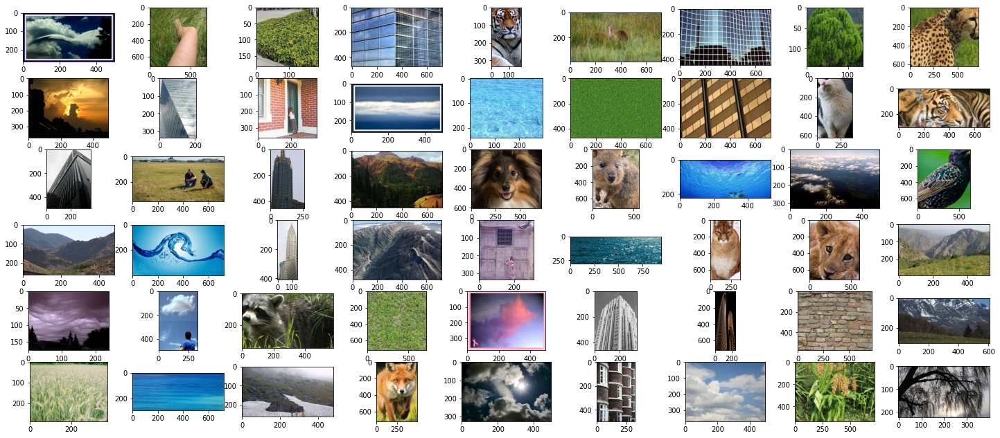

In [52]:
show_folder(ROOT / 'OutdoorSceneTraining', cols=9, rows=6, figsize=(25, 11))            

# FFHQ

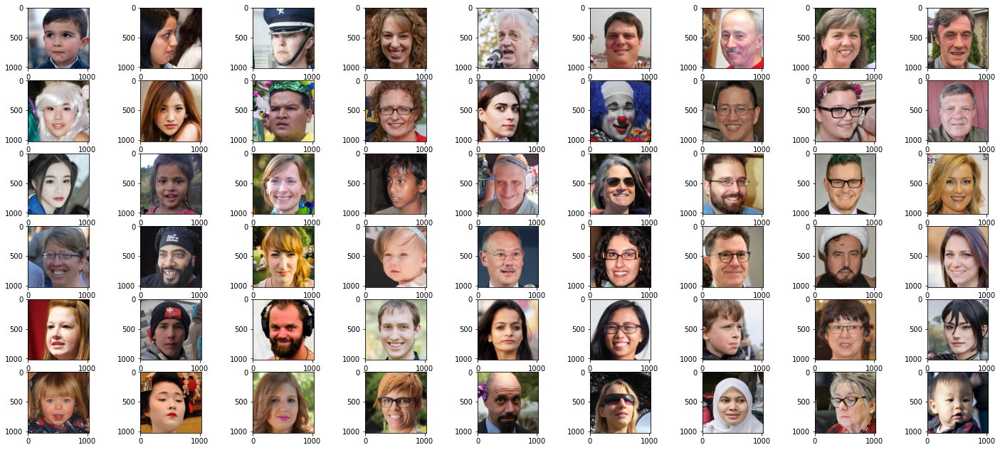

In [20]:
show_folder(ROOT / 'ffhq/originals/valid', cols=9, rows=6, figsize=(25, 11))            

# Wikiart

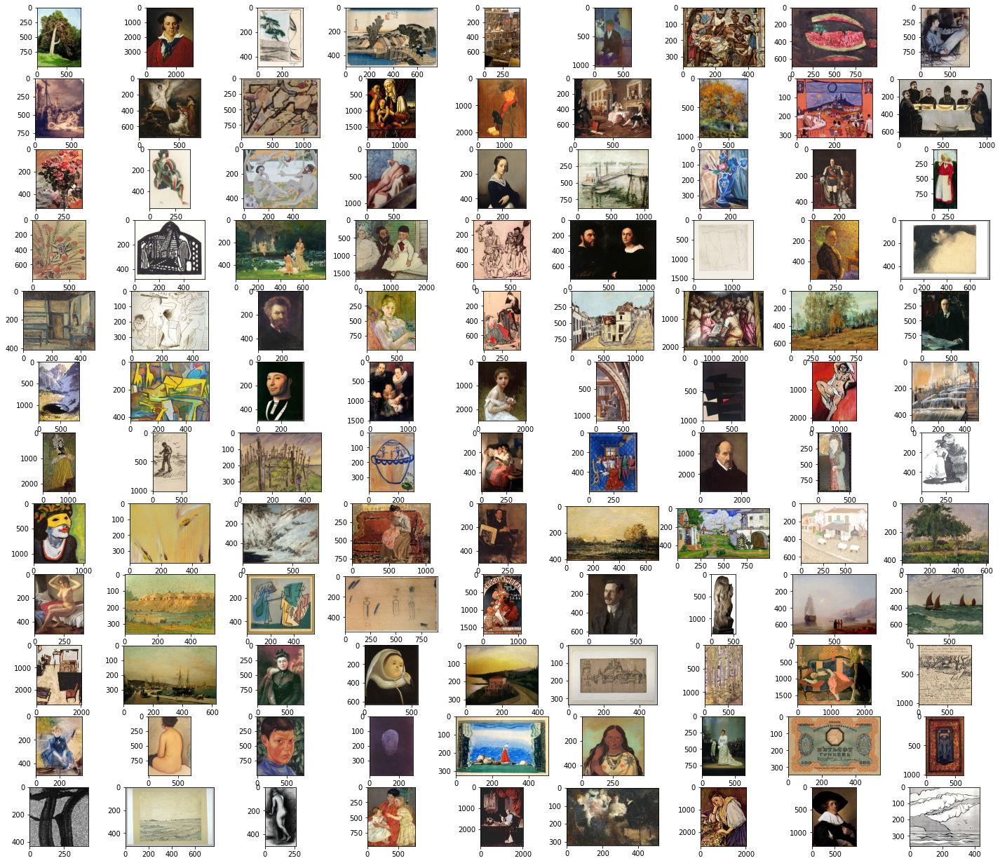

In [40]:
show_folder(ROOT / 'wikiart', cols=9, rows=12, figsize=(25, 22))  

# Flickr2k

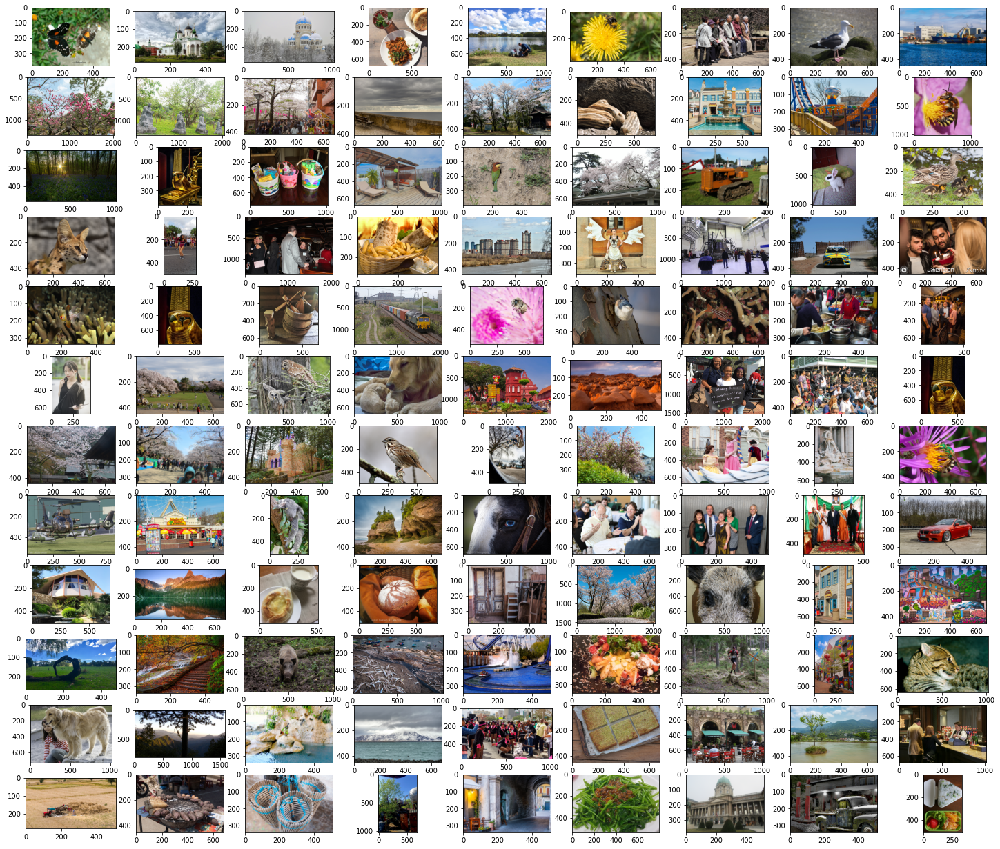

In [54]:
show_folder(ROOT / 'Flickr2K', cols=9, rows=12, figsize=(25, 22))  